# Spikein series all patients

In [10]:
# Imports

%load_ext autoreload
%autoreload 2

import io
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pysam
import warnings
from sklearn.metrics import precision_recall_curve, f1_score, average_precision_score
warnings.filterwarnings('ignore')
from sklearn.metrics import confusion_matrix

# set working directory
if not os.getcwd().endswith('cfdna_snv_benchmark'):
    os.chdir('../')
print('Current working directory: {}'.format(os.getcwd()))

from utils.config import Config
from utils.viz import *
from utils.table import *
from utils.metrics import *
from utils.calltable import *
from utils.venn import venn6, get_labels

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Current working directory: /Users/hanae/Repositories/cfdna_snv_benchmark


In [11]:
# Config and Display paramaters

config = Config("config/", "config_viz.yaml")
set_display_params(config)
print(config.methods)

paper
['freebayes', 'mutect2', 'strelka2', 'vardict', 'varscan', 'abemus', 'sinvict_level1', 'sinvict_level2', 'sinvict_level4']


In [12]:
# Chomosome

chrom = '22'
mixtureids =  ['CRC-COSMIC-5p_CRC-1014_090516-CW-T', 'CRC-COSMIC-5p_CRC-986_300316-CW-T', 'CRC-COSMIC-5p_CRC-123_121115-CW-T']
refname='inCRC-COSMIC-5psamplebythesamecaller'

In [13]:
def function_to_split(hand,labl,dividor):

    Hand_L=[]
    Hand_M=[]
    Labl_L=[]
    Labl_M=[]

    for h,l in zip(hand,labl):
        co=h.get_color()
        ls=h.get_linestyle()
        lw=h.get_linewidth()
        mk=h.get_marker()
        mew=h.get_markeredgewidth()
        ms=h.get_markersize()

        LABS=l.split(dividor)

        if len(LABS) != 2:
            print('Split Legends Error: Only exactly 1 Dividor is accepted.')
            print('                     Currently ' + str(len(LABS)-1) + ' dividors were given')
            return hand,labl

        #Line and Color
        LICO = plt.Line2D((0,1),(0,0), color=co, marker='', linestyle=ls,linewidth=lw)
        #Marker
        MARK = plt.Line2D((0,1),(0,0), color='k', marker=mk, markeredgewidth=mew, markersize=ms, linestyle='')

        if LABS[0] not in Labl_L:
            Hand_L.append(LICO)
            Labl_L.append(LABS[0])

        if LABS[1] not in Labl_M:
            Hand_M.append(MARK)
            Labl_M.append(LABS[1])

    return Hand_L+Hand_M,Labl_L+Labl_M

In [14]:
markers = ['o', '^', 'X']
linestyles = ['-', '-', '-']
color_dict = {config.methods[i]: config.colors[i] for i in range(len(config.methods))}

In [15]:
muttypes = ['snv']
metrics = ['auprc', 'precision', 'recall']

# Mixtures - fixed coverage - each Patient in one plot

In [36]:
restablesample[restablesample['caller'] == method].sort_values(by='VAF', ascending=False)

,RECALL score,VAF,caller,plasma sample,healthy sample,mutation type,metric
17,0.922280,0.300,sinvict_level4,CRC-COSMIC-5p,CRC-123_121115-CW-T,inCRC-COSMIC-5psamplebythesamecaller,recall
26,0.917098,0.200,sinvict_level4,CRC-COSMIC-5p,CRC-123_121115-CW-T,inCRC-COSMIC-5psamplebythesamecaller,recall
35,0.896373,0.150,sinvict_level4,CRC-COSMIC-5p,CRC-123_121115-CW-T,inCRC-COSMIC-5psamplebythesamecaller,recall
44,0.575130,0.100,sinvict_level4,CRC-COSMIC-5p,CRC-123_121115-CW-T,inCRC-COSMIC-5psamplebythesamecaller,recall
53,0.010363,0.050,sinvict_level4,CRC-COSMIC-5p,CRC-123_121115-CW-T,inCRC-COSMIC-5psamplebythesamecaller,recall
62,0.010363,0.025,sinvict_level4,CRC-COSMIC-5p,CRC-123_121115-CW-T,inCRC-COSMIC-5psamplebythesamecaller,recall
71,0.010363,0.010,sinvict_level4,CRC-COSMIC-5p,CRC-123_121115-CW-T,inCRC-COSMIC-5psamplebythesamecaller,recall
8,0.010363,0.000,sinvict_level4,CRC-COSMIC-5p,CRC-123_121115-CW-T,inCRC-COSMIC-5psamplebythesamecaller,recall


(216, 8)
CRC-COSMIC-5p
CRC-1014_090516-CW-T
CRC-COSMIC-5p
CRC-986_300316-CW-T
CRC-COSMIC-5p
CRC-123_121115-CW-T
CRC-COSMIC-5p
CRC-1014_090516-CW-T
CRC-COSMIC-5p
CRC-986_300316-CW-T
CRC-COSMIC-5p
CRC-123_121115-CW-T
(216, 7)
CRC-COSMIC-5p
CRC-1014_090516-CW-T
CRC-COSMIC-5p
CRC-986_300316-CW-T
CRC-COSMIC-5p
CRC-123_121115-CW-T
CRC-COSMIC-5p
CRC-1014_090516-CW-T
CRC-COSMIC-5p
CRC-986_300316-CW-T
CRC-COSMIC-5p
CRC-123_121115-CW-T
(216, 7)
CRC-COSMIC-5p
CRC-1014_090516-CW-T
CRC-COSMIC-5p
CRC-986_300316-CW-T
CRC-COSMIC-5p
CRC-123_121115-CW-T
CRC-COSMIC-5p
CRC-1014_090516-CW-T
CRC-COSMIC-5p
CRC-986_300316-CW-T
CRC-COSMIC-5p
CRC-123_121115-CW-T


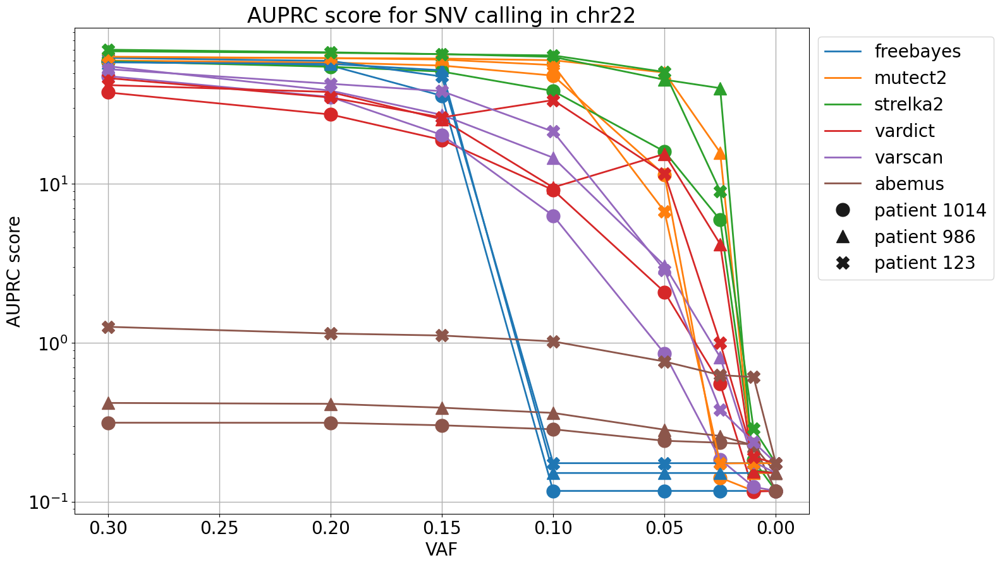

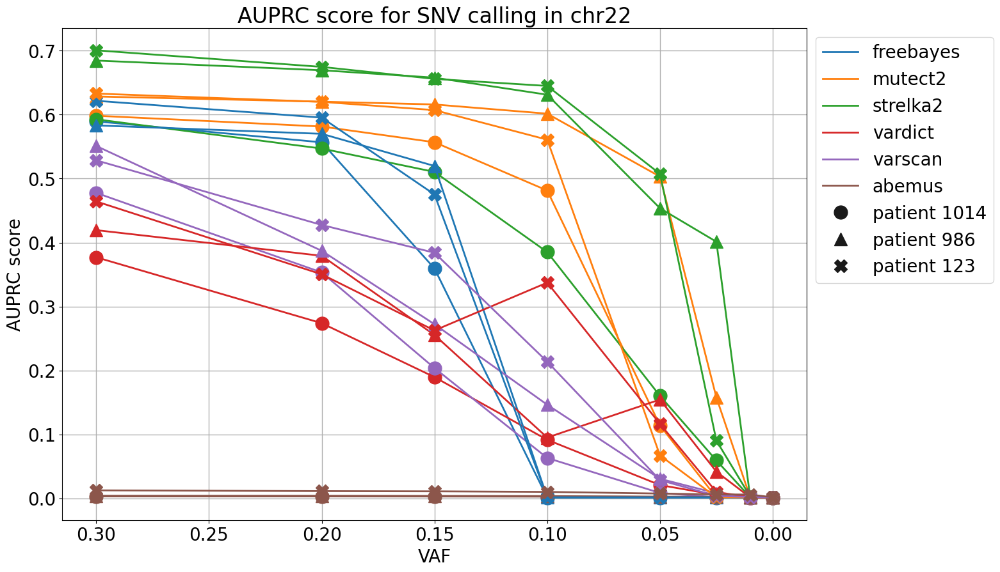

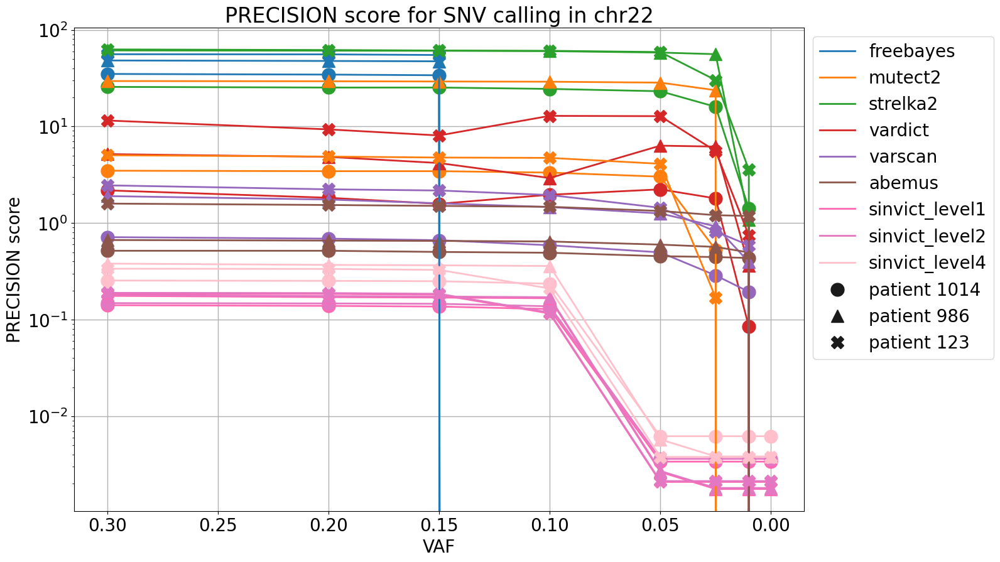

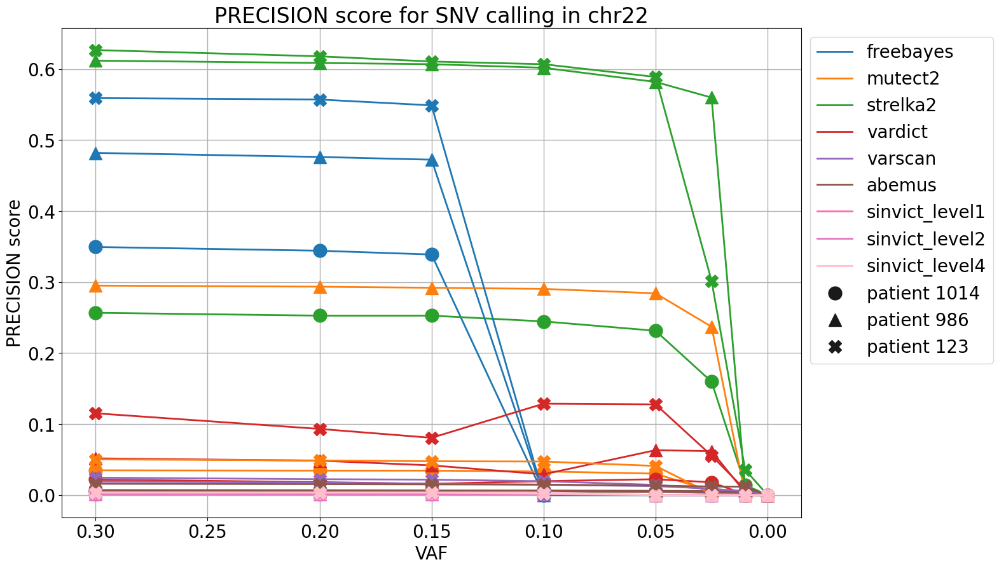

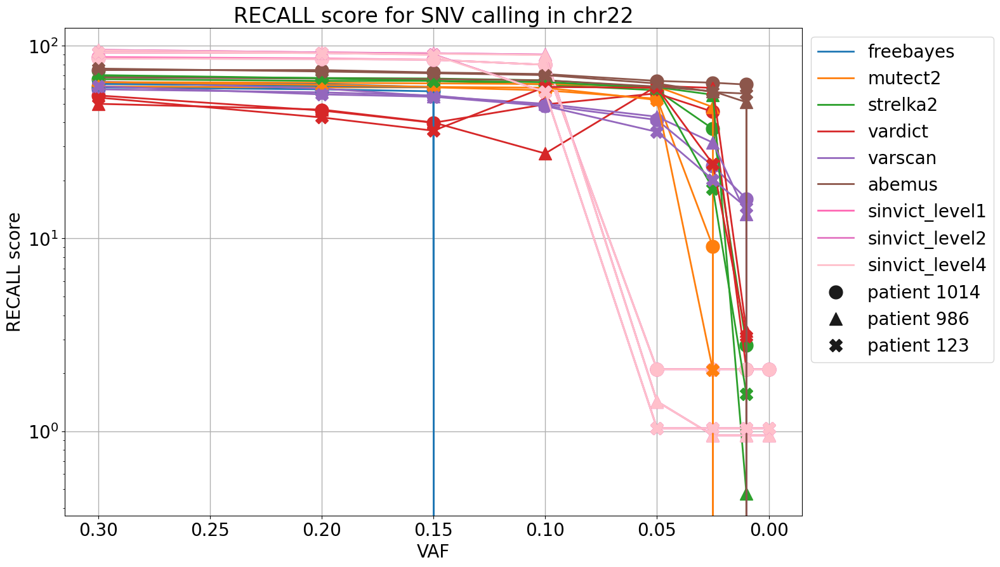

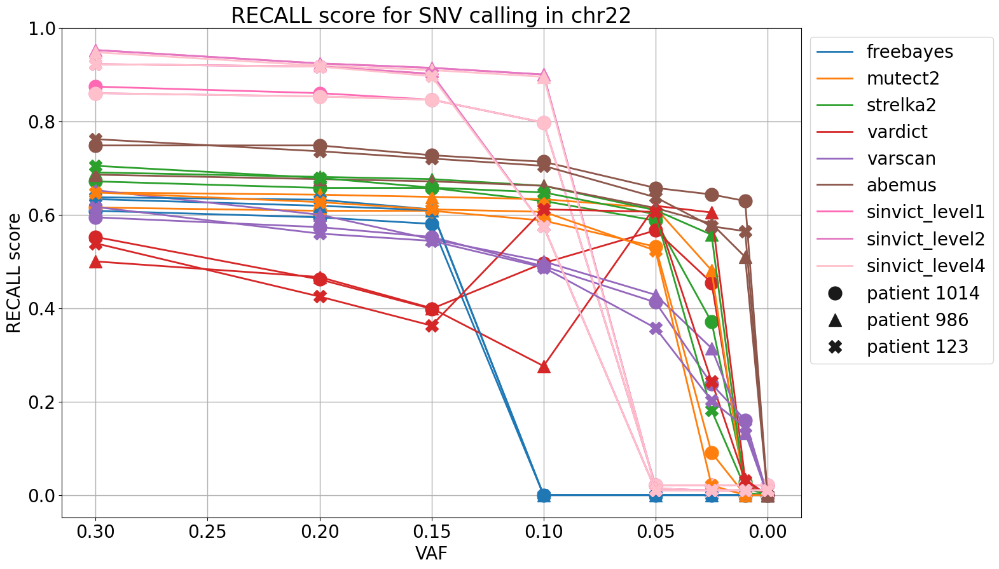

In [39]:
for muttype in muttypes:
    for metric in metrics:

        # Save table if do not exist and load tables

        restables = {'snv':[], 'indel':[]}
        for mt in ['snv']:
            for mixtureid in mixtureids:
                restable = pd.read_csv(os.path.join(*config.spikeinfolder, 'spikeins_chr'+chrom, 'spikeins_chr'+chrom+'_'+mixtureid, 'results', mixtureid+'_'+mt+'_'+metric+'_'+refname+'_fixedcoverage.csv'), index_col=0)
                restables[mt].append(restable)
            restables[mt] = pd.concat(restables[mt])
        restables.keys()
        print(restables['snv'].shape)

        
        plt.figure(figsize=(15,10))
        plt.grid(linewidth=1)
        for mi, mixtureid in enumerate(mixtureids):
            plasmasample = '_'.join(mixtureid.split('_')[:1])
            print(plasmasample)
            healthysample = '_'.join(mixtureid.split('_')[1:])
            print(healthysample)
            restablesample = restables[muttype][restables[muttype]['healthy sample'] == healthysample]
            for method in config.methods:
                if metric == 'auprc' and method.startswith('sinvict'):
                    pass
                elif muttype == 'indel' and method == 'abemus':
                    pass
                else:
                    rt = restablesample[restablesample['caller'] == method].sort_values(by='VAF', ascending=False)
                    plt.plot(rt['VAF'], 100*rt[metric.upper()+' score'],
                          c=color_dict[method], marker=markers[mi], markersize=15, lw=2, ls=linestyles[mi], label = method + '*' + 'patient '+healthysample.split('_')[0].split('-')[1])
                
                
        plt.gca().invert_xaxis()
        plt.xlabel('VAF')
        plt.ylabel(metric.upper()+' score')
        plt.title(metric.upper() + " score for {} calling in chr{}".format(muttype.upper(), chrom))
        plt.semilogy()
        ax = plt.gca()
        hand, labl = ax.get_legend_handles_labels()
        hand, labl = function_to_split(hand,labl,'*')
        ax.legend(hand,labl, bbox_to_anchor=(1,1), loc="upper left")


        plt.figure(figsize=(15,10))
        plt.grid(linewidth=1)
        for mi, mixtureid in enumerate(mixtureids):
            plasmasample = '_'.join(mixtureid.split('_')[:1])
            print(plasmasample)
            healthysample = '_'.join(mixtureid.split('_')[1:])
            print(healthysample)
            restablesample = restables[muttype][restables[muttype]['healthy sample'] == healthysample]
            for method in config.methods:
                if metric == 'auprc' and method.startswith('sinvict'):
                    pass
                elif muttype == 'indel' and method == 'abemus':
                    pass
                else:
                    rt = restablesample[restablesample['caller'] == method].sort_values(by='VAF', ascending=False)
                    plt.plot(rt['VAF'], rt[metric.upper()+' score'],
                          c=color_dict[method], marker=markers[mi], markersize=15, lw=2, ls=linestyles[mi], label = method + '*' + 'patient '+healthysample.split('_')[0].split('-')[1])
        plt.gca().invert_xaxis()
        ax = plt.gca()
        hand, labl = ax.get_legend_handles_labels()
        hand, labl = function_to_split(hand,labl,'*')
        ax.legend(hand,labl, bbox_to_anchor=(1,1), loc="upper left")
        plt.xlabel('VAF')
        plt.ylabel(metric.upper()+' score')
        plt.title(metric.upper() + " score for {} calling in chr{}".format(muttype.upper(), chrom))

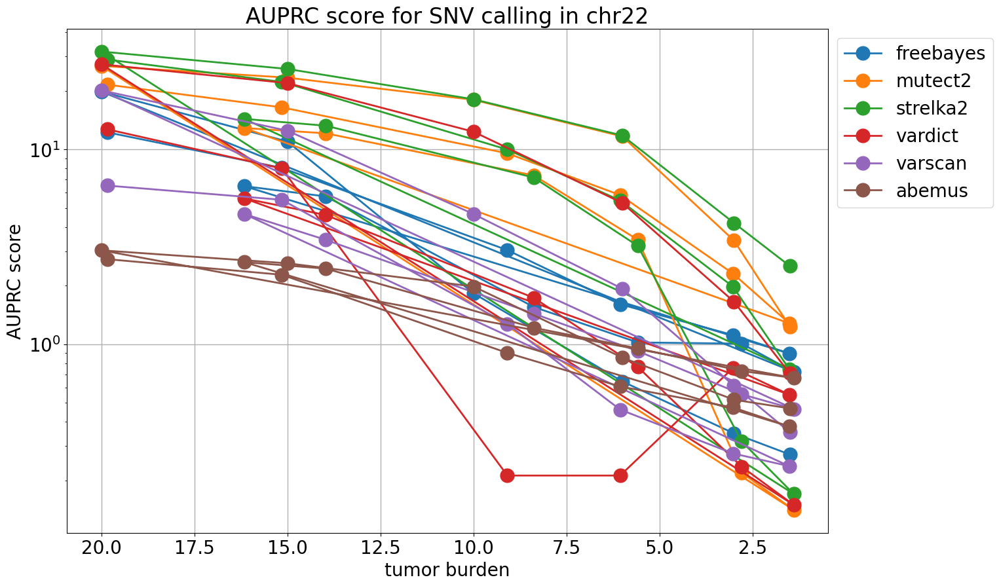

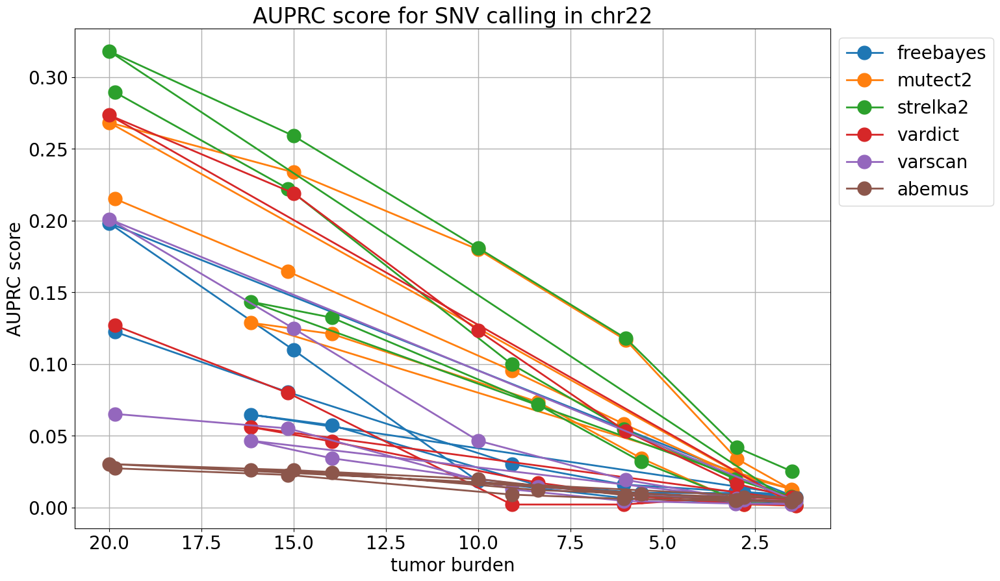

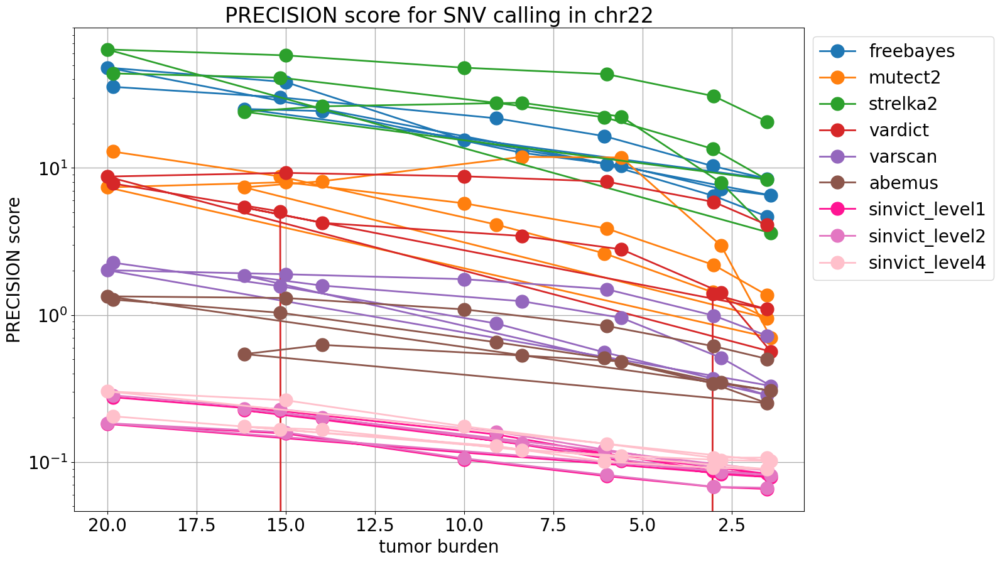

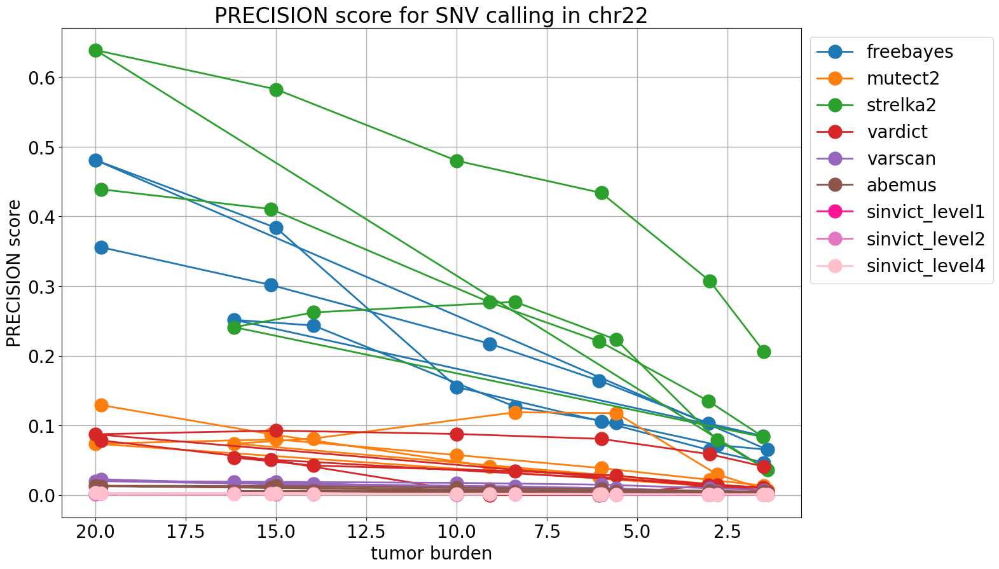

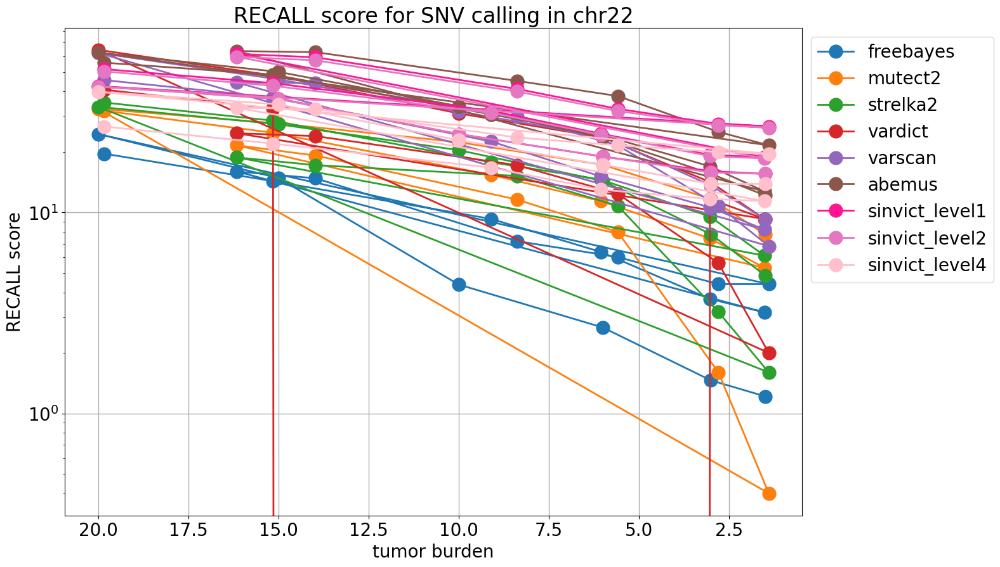

...

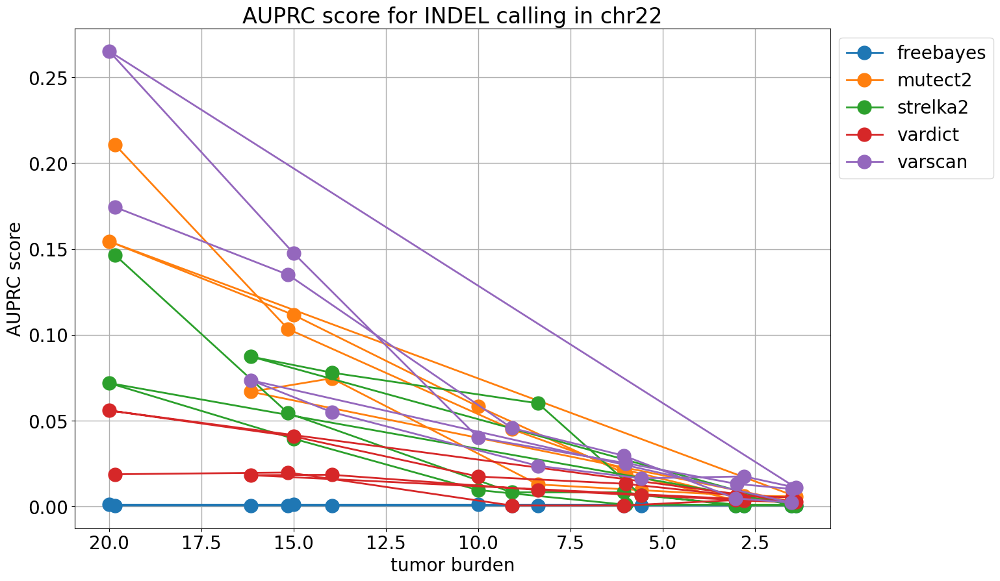

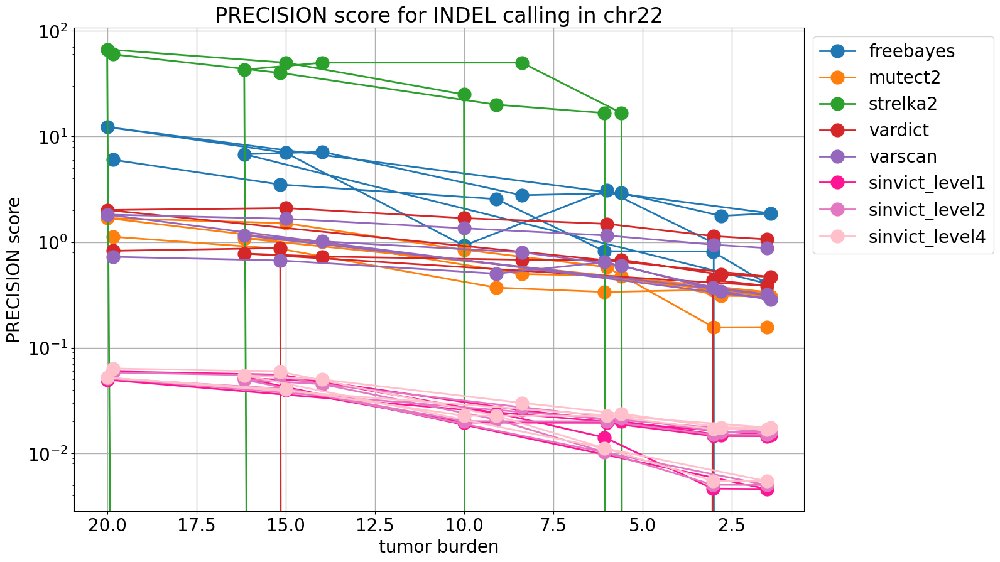

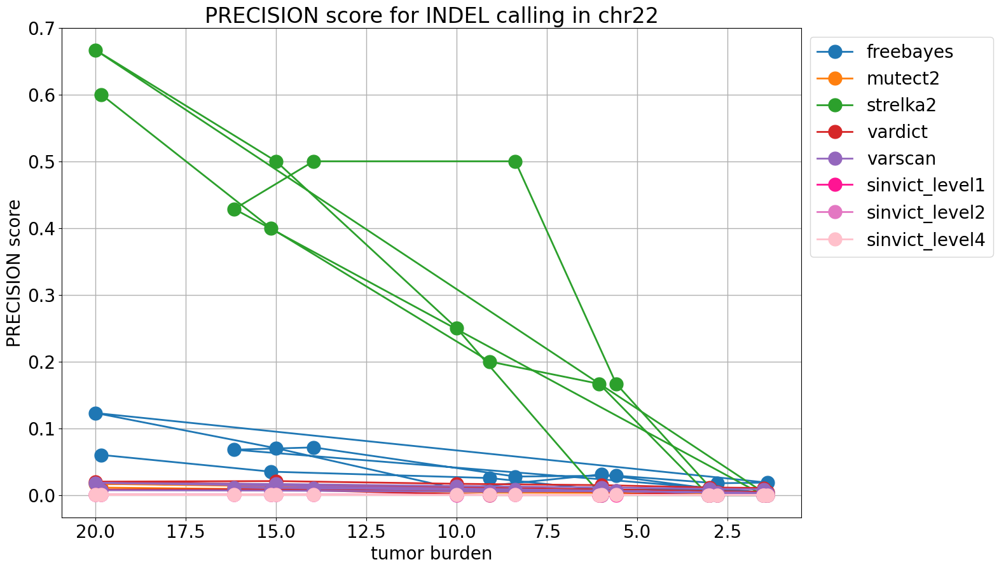

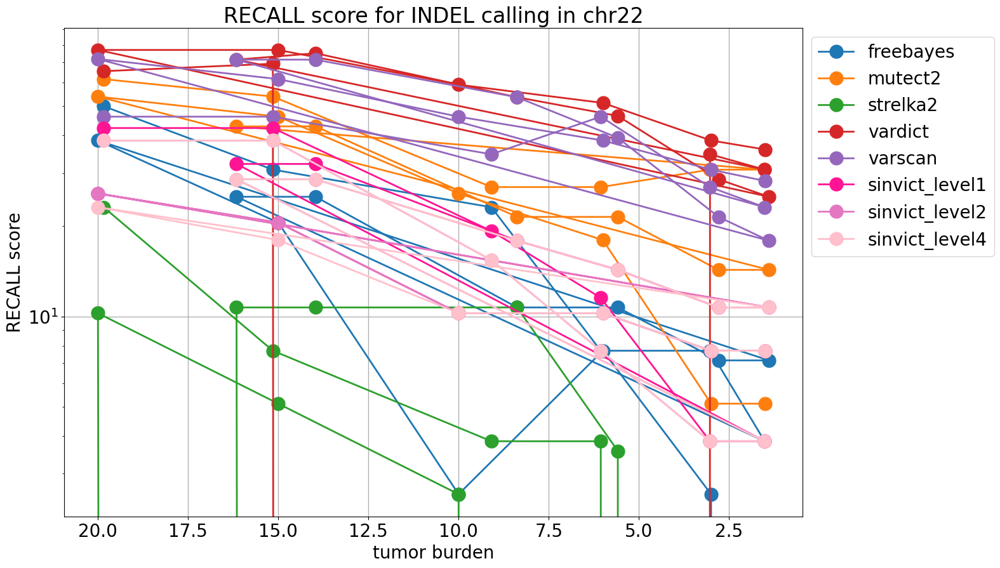

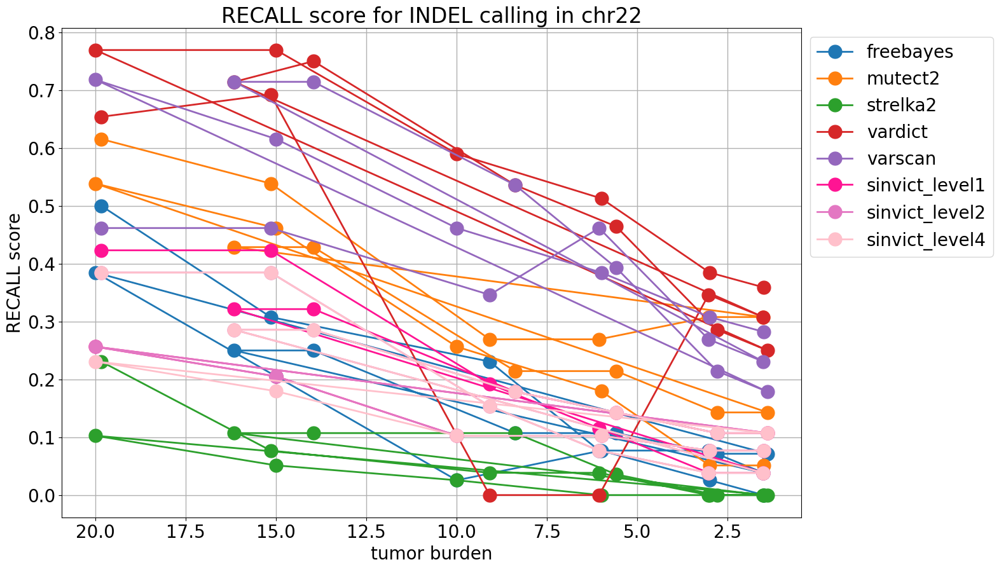

In [110]:
for muttype in muttypes:
    for metric in metrics:

        # Save table if do not exist and load tables

        restables = {'snv':[], 'indel':[]}
        for mt in ['snv', 'indel']:
            for mixtureid in mixtureids:
                restable = pd.read_csv(os.path.join(*config.mixturefolder, 'mixtures_chr'+chrom, 'mixtures_chr'+chrom+'_'+mixtureid, 'results', mixtureid+'_'+mt+'_'+metric+'_'+refname+'.csv'), index_col=0)
                restables[mt].append(restable)
            restables[mt] = pd.concat(restables[mt])

        restablesample = restables[muttype].copy()
        
        plt.figure(figsize=(15,10))
        plt.grid(linewidth=1)
        for method in config.methods:
            if metric == 'auprc' and method.startswith('sinvict'):
                pass
            elif muttype == 'indel' and method == 'abemus':
                pass
            else:
                plt.plot(restablesample[restablesample['caller'] == method]['tumor burden'], 100*restablesample[restablesample['caller'] == method][metric.upper()+' score'],
                      c=color_dict[method], marker=markers[0], markersize=15, lw=2, ls=linestyles[mi], label = method)
                
        plt.gca().invert_xaxis()
        plt.xlabel('tumor burden')
        plt.ylabel(metric.upper()+' score')
        plt.title(metric.upper() + " score for {} calling in chr{}".format(muttype.upper(), chrom))
        plt.semilogy()
        ax = plt.gca()
        plt.legend()
        hand, labl = ax.get_legend_handles_labels()
        ax.legend(hand,labl, bbox_to_anchor=(1,1), loc="upper left")


        plt.figure(figsize=(15,10))
        plt.grid(linewidth=1)
        for method in config.methods:
            if metric == 'auprc' and method.startswith('sinvict'):
                pass
            elif muttype == 'indel' and method == 'abemus':
                pass
            else:
                plt.plot(restablesample[restablesample['caller'] == method]['tumor burden'], restablesample[restablesample['caller'] == method][metric.upper()+' score'],
                      c=color_dict[method], marker=markers[0], markersize=15, lw=2, ls=linestyles[mi], label = method)
        plt.gca().invert_xaxis()
        ax = plt.gca()
        hand, labl = ax.get_legend_handles_labels()
        plt.legend()
        ax.legend(hand,labl, bbox_to_anchor=(1,1), loc="upper left")
        plt.xlabel('tumor burden')
        plt.ylabel(metric.upper()+' score')
        plt.title(metric.upper() + " score for {} calling in chr{}".format(muttype.upper(), chrom))

# Mixtures - fixed ctDNA - all patients

(108, 8)
(108, 7)
(108, 7)
(108, 8)
(108, 7)
(108, 7)


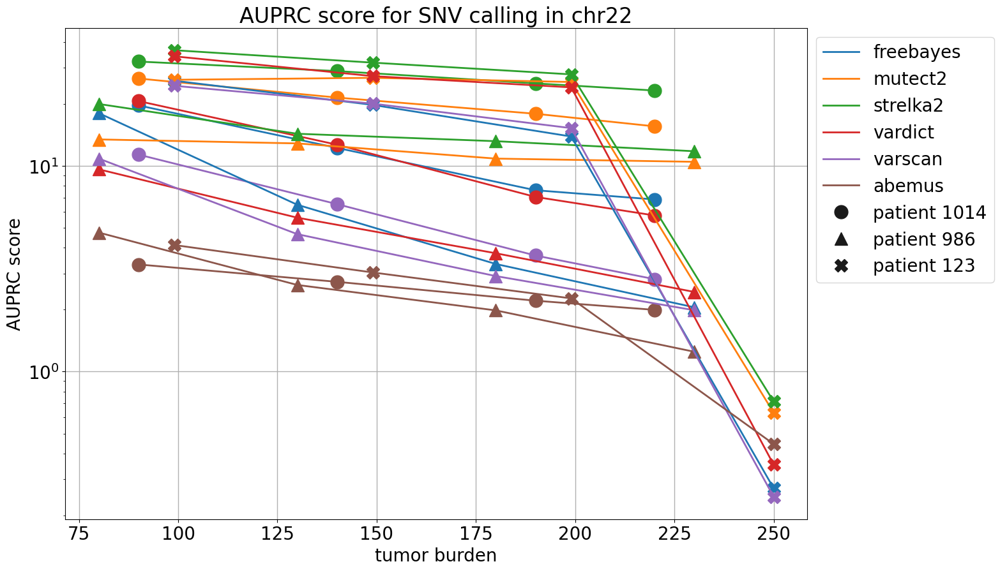

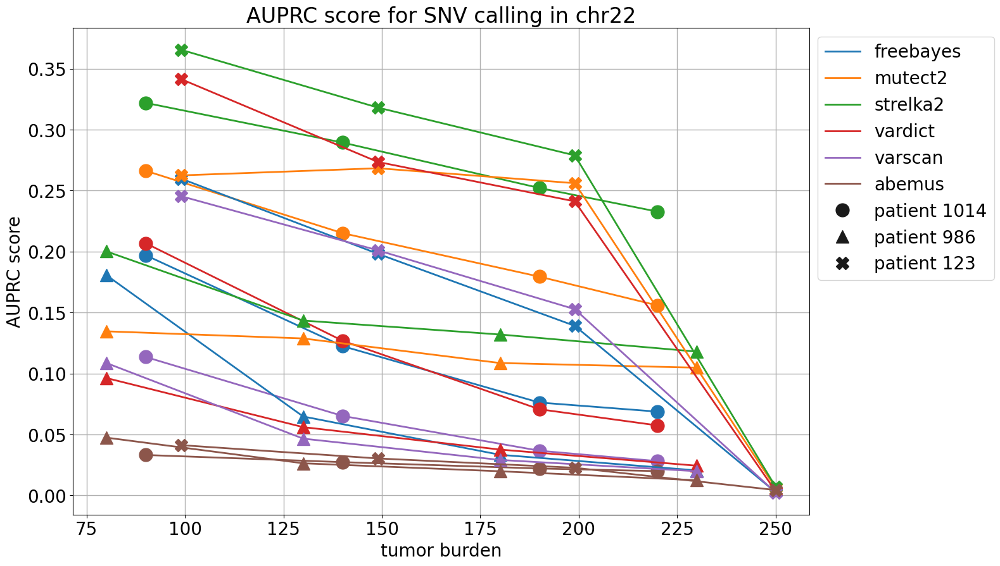

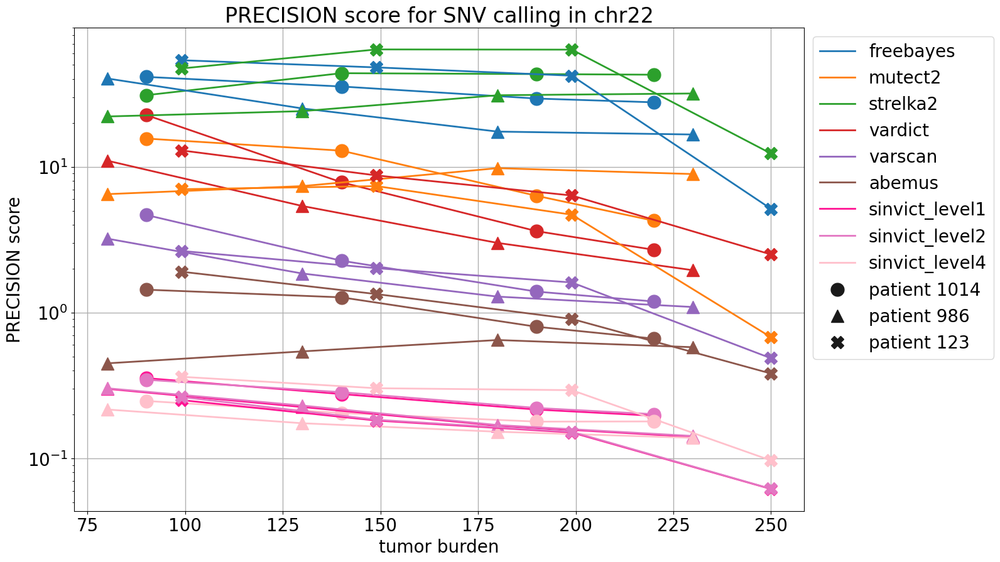

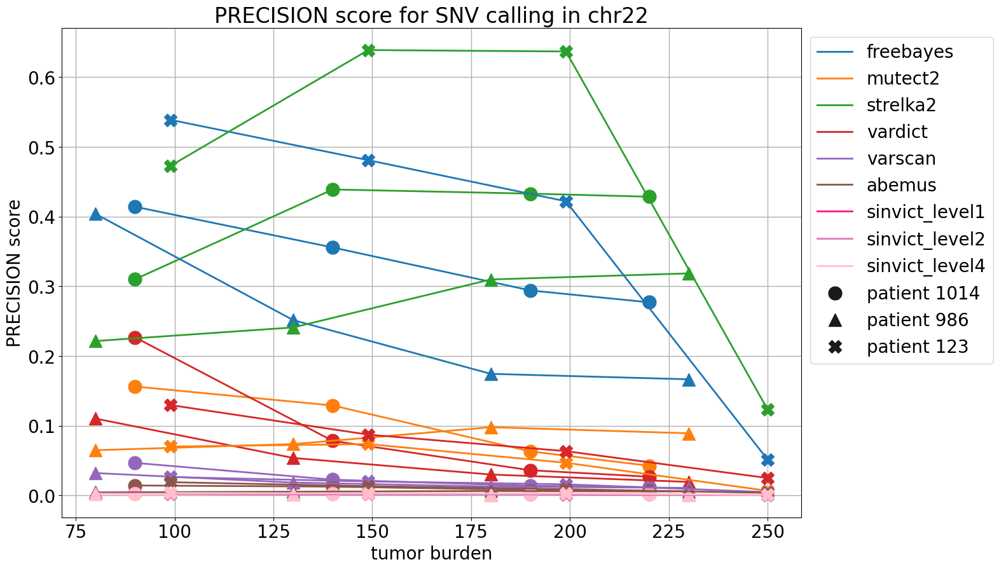

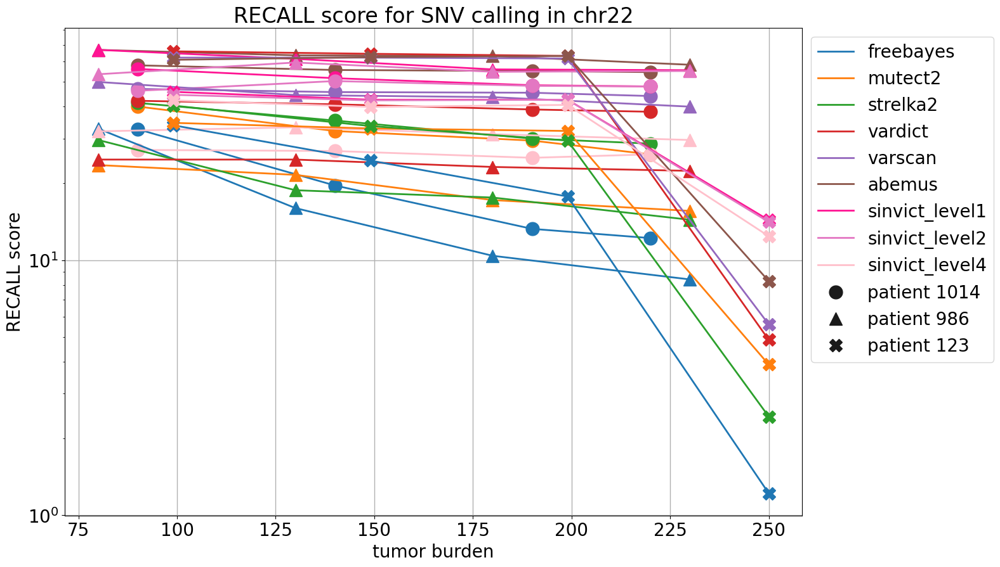

...

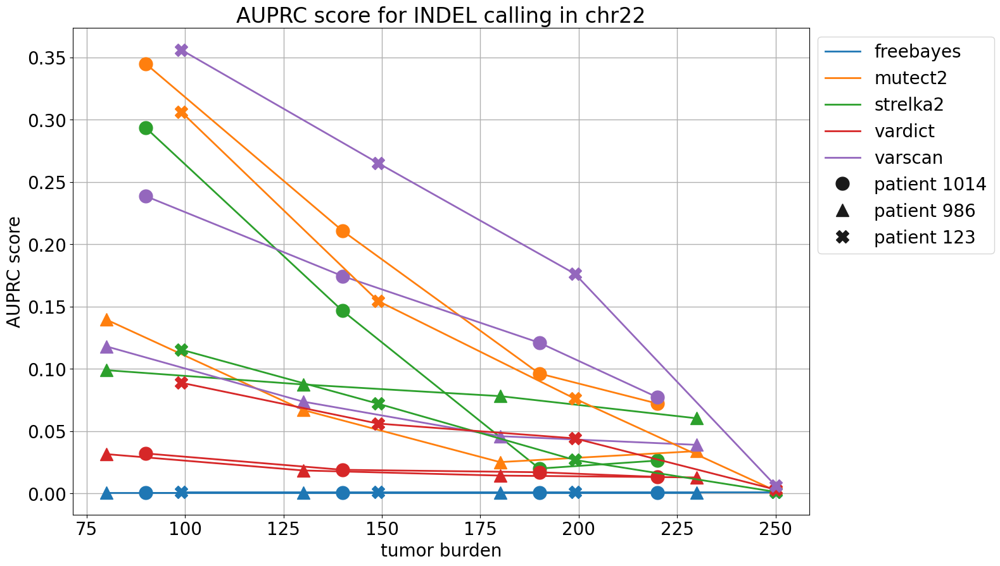

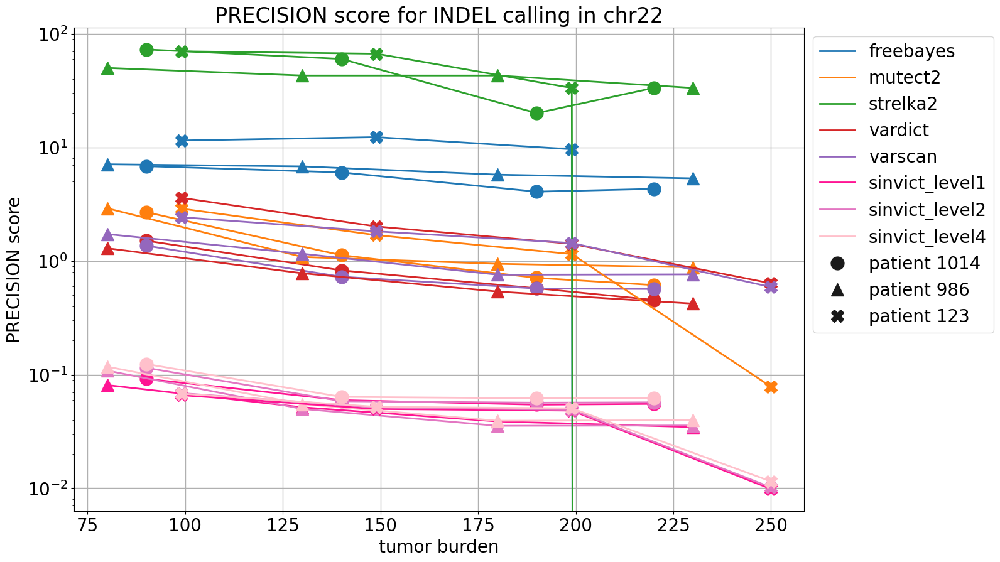

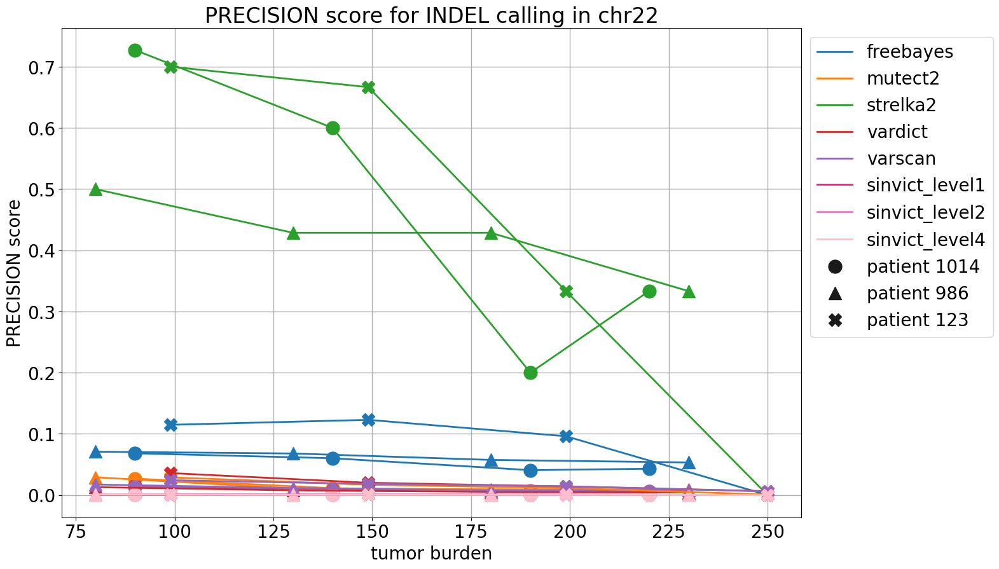

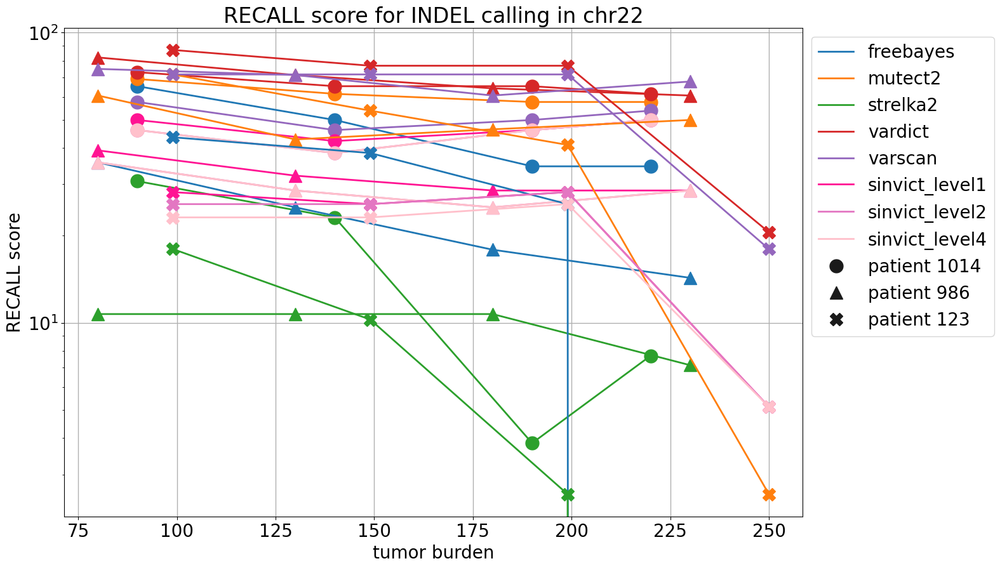

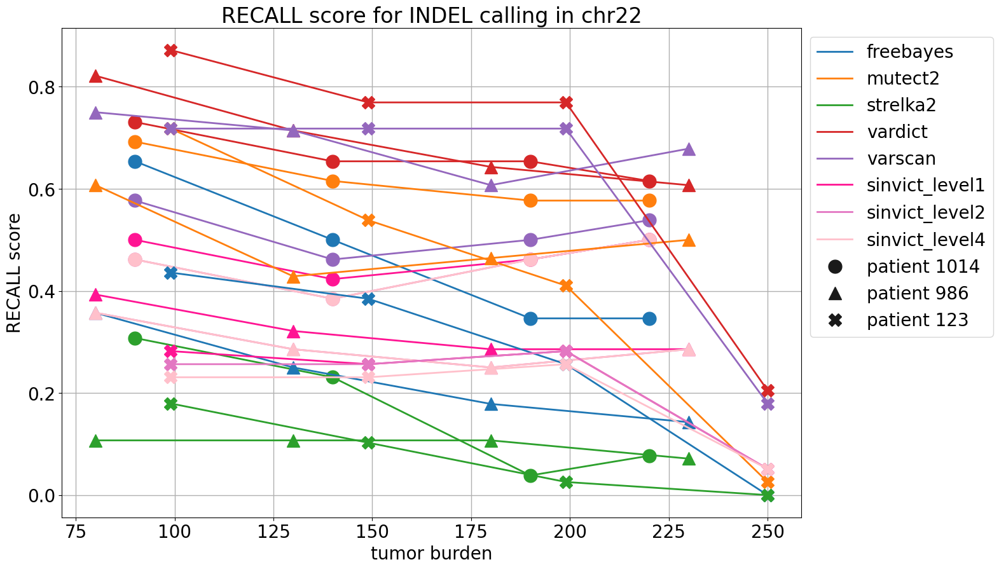

In [105]:
for muttype in muttypes:
    for metric in metrics:

        # Save table if do not exist and load tables

        restables = {'snv':[], 'indel':[]}
        for mt in ['snv', 'indel']:
            for mixtureid in mixtureids:
                restable = pd.read_csv(os.path.join(*config.mixturefolder, 'mixtures_chr'+chrom, 'mixtures_chr'+chrom+'_'+mixtureid, 'results', mixtureid+'_'+mt+'_'+metric+'_'+refname+'_fixedctdna.csv'), index_col=0)
                restables[mt].append(restable)
            restables[mt] = pd.concat(restables[mt])
        restables.keys()
        print(restables['snv'].shape)
        restables['snv'].head()


        
        
        plt.figure(figsize=(15,10))
        plt.grid(linewidth=1)
        for mi, mixtureid in enumerate(mixtureids):
            plasmasample = '_'.join(mixtureid.split('_')[:2])
            restablesample = restables[muttype][restables[muttype]['plasma sample'] == plasmasample]
            for method in config.methods:
                if metric == 'auprc' and method.startswith('sinvict'):
                    pass
                elif muttype == 'indel' and method == 'abemus':
                    pass
                else:
                    plt.plot(restablesample[restablesample['caller'] == method]['coverage'], 100*restablesample[restablesample['caller'] == method][metric.upper()+' score'],
                          c=color_dict[method], marker=markers[mi], markersize=15, lw=2, ls=linestyles[mi], label = method + '*' + 'patient '+plasmasample.split('_')[0].split('-')[1])
                
        plt.xlabel('tumor burden')
        plt.ylabel(metric.upper()+' score')
        plt.title(metric.upper() + " score for {} calling in chr{}".format(muttype.upper(), chrom))
        plt.semilogy()
        ax = plt.gca()
        hand, labl = ax.get_legend_handles_labels()
        hand, labl = function_to_split(hand,labl,'*')
        ax.legend(hand,labl, bbox_to_anchor=(1,1), loc="upper left")


        plt.figure(figsize=(15,10))
        plt.grid(linewidth=1)
        for mi, mixtureid in enumerate(mixtureids):
            plasmasample = '_'.join(mixtureid.split('_')[:2])
            restablesample = restables[muttype][restables[muttype]['plasma sample'] == plasmasample]
            for method in config.methods:
                if metric == 'auprc' and method.startswith('sinvict'):
                    pass
                elif muttype == 'indel' and method == 'abemus':
                    pass
                else:
                    plt.plot(restablesample[restablesample['caller'] == method]['coverage'], restablesample[restablesample['caller'] == method][metric.upper()+' score'],
                          c=color_dict[method], marker=markers[mi], markersize=15, lw=2, ls=linestyles[mi], label = method + '*' + 'patient '+plasmasample.split('_')[0].split('-')[1])
        ax = plt.gca()
        hand, labl = ax.get_legend_handles_labels()
        hand, labl = function_to_split(hand,labl,'*')
        ax.legend(hand,labl, bbox_to_anchor=(1,1), loc="upper left")
        plt.xlabel('tumor burden')
        plt.ylabel(metric.upper()+' score')
        plt.title(metric.upper() + " score for {} calling in chr{}".format(muttype.upper(), chrom))